# Plotting gridded DBPM outputs
**Author**: Denisse Fierro Arcos  
**Date**: 2025-02-06  

In this notebook, we will create a variety of plots using the outputs of gridded DBPM runs.

## Loading relevant libraries

In [1]:
import os
os.chdir('/g/data/vf71/la6889/dbpm_southern_ocean/scripts/')
import useful_functions as uf
from glob import glob
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.animation as animation
import matplotlib.gridspec as gridspec
import matplotlib.patheffects as PathEffects
from IPython.display import HTML
import cmocean as cm
import cartopy.crs as ccrs
import cartopy.feature as cft
from dask.distributed import Client

## Start a cluster for parallelisation

In [2]:
client = Client(threads_per_worker = 1, memory_limit = 0)

## Defining basic variables to run gridded DBPM

In [16]:
#Name of region and model resolution
region = 'fao-48'
reg_name = 'weddell'
model_res = '1deg'

# Paths to input and output folders
base_folder = f'/g/data/vf71/la6889/dbpm_inputs/{reg_name}'
gridded_inputs = os.path.join(base_folder, 'gridded_params', model_res)
gridded_outputs_old_eff = os.path.join(base_folder, 'run_fishing', model_res)
gridded_outputs_new_eff = os.path.join(base_folder, 'run_fishing_new_eff', model_res)
outputs_folder = os.path.join(base_folder, 'gridded_dbpm_outputs', model_res)

## Loading area file to create mask for region

In [17]:
mask = xr.open_zarr(glob(os.path.join(base_folder, 'gridded', model_res, 
                                      '*areacello*'))[0])['cellareao']
mask = xr.where(np.isfinite(mask), 1, np.nan)

In [4]:
# Getting longitude for filtering
if mask.lon.max() > 180:
    lon_filter = ((mask.lon+180)%360)-180
else:
    lon_filter = mask.lon

## Loading sea ice data
Calculate mean sea ice cover per year and identify the edge of the sea ice, which is defined as the grid cells where sea ice concentration is 15\%.

In [5]:
global_folder = '/g/data/vf71/fishmip_inputs/ISIMIP3a/global_inputs/obsclim'

#Load global sea ice coverage
si = xr.open_dataarray(
    glob(os.path.join(global_folder, model_res,
                      'gfdl-mom6-cobalt2_obsclim_siconc_*'))[0])

In [6]:
#Calculate average SIC per year
si_yr = si.sel(lat = mask.lat, lon = lon_filter).groupby('time.year').mean('time')

#If mask longitude in 0-360, then apply the same to SIC data
if mask.lon.max() > 180:
    si_yr['lon'] = si_yr.lon%360
    si_yr = si_yr.sortby('lon')

#Apply land mask
si_yr = si_yr*mask

In [41]:
#Identify sea ice edge from mean annual sea ice coverage data
sie = xr.where(si_yr >= 15, 1, 0)*mask

### Save sea ice data

In [8]:
si_yr.to_netcdf(os.path.join(
    base_folder, 'gridded', model_res,
    f'gfdl-mom6-cobalt2_obsclim_siconc_{model_res}_{region}_yearly_1961_2010.nc'))
sie.to_netcdf(os.path.join(
    base_folder, 'gridded', model_res, 
    f'sie_obsclim_{model_res}_{region}_yearly_1961_2010.nc'))

### **Optional**: Load sea ice data
If previously process, simply load sea ice data to the notebook.

In [18]:
si_yr = xr.open_dataarray(os.path.join(
    base_folder, 'gridded', model_res,
    f'gfdl-mom6-cobalt2_obsclim_siconc_{model_res}_{region}_yearly_1961_2010.nc'))
sie = xr.open_dataarray(os.path.join(
    base_folder, 'gridded', model_res, 
    f'sie_obsclim_{model_res}_{region}_yearly_1961_2010.nc'))

## Loading total catches estimated by DBPM

In [19]:
# Load estimated catches
total_catch = xr.open_zarr(glob(
    os.path.join(outputs_folder, f'total_catches_{model_res}_*'))[0])['total_catches']

# Calculate mean catches per year - Model period only (1961-2010)
total_catch_mod = (total_catch.sel(time = slice('1961', None)).groupby('time.year').
    mean('time'))*mask

## Calculate decadal means

In [20]:
yrs = total_catch_mod.year.values
decades = ((yrs-yrs[0])/10).astype(int)
dec = pd.DataFrame({'years': total_catch_mod.year.values})
dec['decades'] = ((dec.years-dec.years[0])/10).astype(int)

### Mean decadal catches estimated by DBPM

In [21]:
catch_dec = []
for d in pd.unique(dec.decades):
    yrs = dec[dec.decades == d]['years'].values
    dec_mean = (total_catch_mod.sel(year = yrs).mean('year').
        assign_coords({'decade': (yrs.min()-1).astype(str)}))
    catch_dec.append(dec_mean)

# Apply mask to remove grid cells over land
catch_dec = xr.concat(catch_dec, dim = 'decade')*mask

### Mean decadal sea ice extent

In [22]:
sie_dec = []
for d in pd.unique(dec.decades):
    yrs = dec[dec.decades == d]['years'].values
    dec_mean = (si_yr.sel(year = yrs).mean('year').
        assign_coords({'decade': (yrs.min()-1).astype(str)}))
    sie_dec.append(dec_mean)

sie_dec = xr.concat(sie_dec, dim = 'decade')

# Sea ice edge is defined as grid cells with SIC of 15% or more
sie_dec = xr.where(sie_dec >= 15, 1, 0)*mask

## Plotting decadal catches

In [23]:
land_50m = cft.NaturalEarthFeature('physical', 'land', '50m', edgecolor = 'black',
                               facecolor = 'gray', linewidth = 0.5)

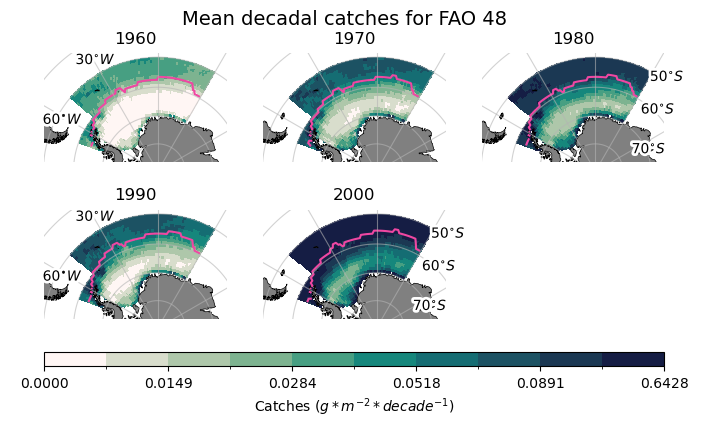

In [24]:
levels = catch_dec.quantile(np.arange(0, 1.1, 0.1)).values

decades = catch_dec.decade.values.tolist()

# FAO 48 -----
fig = plt.figure(figsize = (8, 4.25))
# FAO 88 -----
# fig = plt.figure(figsize = (8, 6))
# FAO 58 -----
# fig = plt.figure(figsize = (8, 8.25))

gs = gridspec.GridSpec(nrows = 3, ncols = 3, height_ratios = (1, 1, 0.1))

ax = {}
for i in range(len(decades)):
    ax[i] = fig.add_subplot(gs[i], projection = ccrs.SouthPolarStereo())
    p1 = catch_dec.isel(decade = i).plot(levels = levels,
                                        cmap = cm.cm.tempo, add_colorbar = False,
                                        transform = ccrs.PlateCarree())
    sie_dec.isel(decade = i).plot.contour(levels = [0], colors = '#ef47a2',
                                          ax = ax[i],
                                          transform = ccrs.PlateCarree())
    ax[i].set_title(decades[i], y = 1.02)
    ax[i].add_feature(land_50m)
    #Cutomise area shown in the maps
    # FAO 48 -----
    ax[i].set_extent([-70, 35, -80, -48], crs = ccrs.PlateCarree())
    # FAO 88 -----
    # Do not set extent
    # FAO 58 -----
    # ax[i].set_extent([30, 150, -80, -45], crs = ccrs.PlateCarree())
    #Remove border around map
    [s.set_visible(False) for s in ax[i].spines.values()]
    gl = ax[i].gridlines(draw_labels = True, y_inline = False, 
                         color = "#b4b4b4", alpha = 0.6)
    # #Removing coordinate labels for latitude and longitude
    gl.xlabel_style = {'alpha': 0}
    gl.ylabel_style = {'alpha': 0}
    
    #Adding gridline labels
    # FAO 88 ----- Apply to all subplots
    # Latitudes
    # plt.text(0.6, 0.23, '$70^{\circ}S$', transform = ax[i].transAxes, fontsize = 10,
    #     path_effects = [PathEffects.withStroke(linewidth = 4, foreground = 'w')])
    # plt.text(0.6, 0.49, '$80^{\circ}S$', transform = ax[i].transAxes, fontsize = 10,
    #         path_effects = [PathEffects.withStroke(linewidth = 4, foreground = 'w')])
    # # Longitudes
    # plt.text(0.17, 0.99, '$60^{\circ}W$', transform = ax[i].transAxes, fontsize = 10,
    #     path_effects = [PathEffects.withStroke(linewidth = 4, foreground = 'w')])
    # plt.text(-0.1, 0.27, '$120^{\circ}W$', transform = ax[i].transAxes, fontsize = 10)
    # plt.text(0.62, -0.07, '$180^{\circ}$', transform = ax[i].transAxes, fontsize = 10)
    # plt.text(0.95, 0.5, '$120^{\circ}E$', transform = ax[i].transAxes, fontsize = 10,
    #         path_effects = [PathEffects.withStroke(linewidth = 4, foreground = 'w')])
    
    #Adding gridline labels
    if i in [0, 3]:
        # FAO 48 -----
        plt.text(0.17, 0.9, '$30^{\circ}W$', transform = ax[i].transAxes, fontsize = 10,
            path_effects = [PathEffects.withStroke(linewidth = 4, foreground = 'w')])
        plt.text(-0.01, 0.35, '$60^{\circ}W$', transform = ax[i].transAxes, fontsize = 10,
            path_effects = [PathEffects.withStroke(linewidth = 4, foreground = 'w')])
    #     # FAO 58 -----
    #     plt.text(-0.26, 0.98, '$50^{\circ}S$', transform = ax[i].transAxes, fontsize = 10)
    #     plt.text(-0.26, 0.85, '$60^{\circ}S$', transform = ax[i].transAxes, fontsize = 10)
    #     plt.text(-0.26, 0.72, '$70^{\circ}S$', transform = ax[i].transAxes, fontsize = 10)
    #     plt.text(-0.26, 0.59, '$80^{\circ}S$', transform = ax[i].transAxes, fontsize = 10)
    #     plt.text(-0.26, 0.48, '$90^{\circ}S$', transform = ax[i].transAxes, fontsize = 10)
    #     plt.text(-0.26, 0.37, '$80^{\circ}S$', transform = ax[i].transAxes, fontsize = 10)
    #     plt.text(-0.26, 0.24, '$70^{\circ}S$', transform = ax[i].transAxes, fontsize = 10)
    #     plt.text(-0.26, 0.11, '$60^{\circ}S$', transform = ax[i].transAxes, fontsize = 10)
    #     plt.text(-0.26, -0.02, '$50^{\circ}S$', transform = ax[i].transAxes, fontsize = 10)
    elif i in [2, 4]:
        # FAO 48 -----
        plt.text(0.92, 0.745, '$50^{\circ}S$', transform = ax[i].transAxes, fontsize = 10,
            path_effects = [PathEffects.withStroke(linewidth = 4, foreground = 'w')])
        plt.text(0.87, 0.445, '$60^{\circ}S$', transform = ax[i].transAxes, fontsize = 10,
                path_effects = [PathEffects.withStroke(linewidth = 4, foreground = 'w')])
        plt.text(0.82, 0.08, '$70^{\circ}S$', transform = ax[i].transAxes, fontsize = 10,
                path_effects = [PathEffects.withStroke(linewidth = 4, foreground = 'w')])
    #     # FAO 58 -----
    #     plt.text(0.48, 0.98, '$30^{\circ}E$', transform = ax[i].transAxes, fontsize = 10)
    #     plt.text(1, 0.81, '$60^{\circ}E$', transform = ax[i].transAxes, fontsize = 10)
    #     plt.text(1.01, 0.48, '$90^{\circ}E$', transform = ax[i].transAxes, fontsize = 10)
    #     plt.text(1, 0.15, '$120^{\circ}E$', transform = ax[i].transAxes, fontsize = 10)
    #     plt.text(0.44, -0.01, '$150^{\circ}E$', transform = ax[i].transAxes, fontsize = 10)

cbar = fig.colorbar(p1, cax = plt.subplot(gs[-1,:]), orientation = 'horizontal', 
                    pad = 0.075)
cbar.set_label('Catches ($g*m^{-2}*decade^{-1}$)', y = .95)
reg_title = region.upper().replace('-', ' ')
fig.suptitle(f'Mean decadal catches for {reg_title}', fontsize = 14, y = .95)

#Saving figure
fout = os.path.join(outputs_folder, f'decadal_catch_{region}_{model_res}.png')
plt.savefig(fout, dpi = 300, bbox_inches = 'tight', pad_inches = 0.05)

## Loading total observed catches
We will keep the mininum and maximum *observed* catches so we can calculate pseudo-observed catches following [Evans et al 2024](https://doi.org/10.1088/2515-7620/ad5ad8). Note that the catches are in units of $t \times m^2 \times year^{-1}$.

In [5]:
# Load observed catch data
catch_obs = pd.read_parquet(glob(
    os.path.join(base_folder, 'monthly_weighted', model_res, 'dbpm_clim*')))
# Remove rows with NA values
catch_obs = catch_obs[['year', 'min_catch_density', 'max_catch_density']].dropna()
# Calculate the mean annual catches
catch_obs = catch_obs.groupby('year').mean().reset_index()

### Transform catch data to data arrays

In [6]:
# Minimum observed catches
min_catch = (xr.DataArray((catch_obs['min_catch_density']*1e6), 
             dims = 'year', coords = {'year': catch_obs['year'].values}).
    expand_dims({'lat': mask.lat, 'lon': mask.lon}))*mask
# Maximum observed catches
max_catch = (xr.DataArray((catch_obs['max_catch_density']*1e6), 
             dims = 'year', coords = {'year': catch_obs['year'].values}).
    expand_dims({'lat': mask.lat, 'lon': mask.lon}))*mask

In [38]:
# Calculate mean catches per year - Keep same time period as observed data
total_catch = (total_catch.groupby('time.year').mean('time').
    sel(year = min_catch.year)*mask)

## Creating pseudo observed catches
We will use this information to calculate the anomalies. For details see [Evans et al 2024](https://doi.org/10.1088/2515-7620/ad5ad8).

In [8]:
# If estimated catches are less than the minimum observed catches, replace with minimum observed catches
pseudo = xr.where(total_catch < min_catch, min_catch, total_catch)
# If estimated catches are more than the maximum observed catches, replace with maximum observed catches
pseudo = xr.where(total_catch > max_catch, max_catch, pseudo)

## Calculate catch anomalies 
We will substract the pseudo ("observed") catches from the catches estimated by DBPM. This means that positive anomalies indicate areas where DBPM overestimated catch, while negative values indicate an underestimation. We will keep data for the model from 1961 to 2010.

In [9]:
anom_catch = (total_catch-pseudo).sel(year = slice(1961, None))

## Plot catch anomalies

Check range of data before creating a custom colourbar.

In [14]:
print(anom_catch.min().values, anom_catch.max().values)

-0.04220940912951806 1.3213292560045073


(array([8.5501e+04, 1.2871e+04, 2.8280e+03, 7.1800e+02, 1.6400e+02,
        3.7000e+01, 1.5000e+01, 1.1000e+01, 4.0000e+00, 1.0000e+00]),
 array([-0.04220941,  0.09414446,  0.23049832,  0.36685219,  0.50320606,
         0.63955992,  0.77591379,  0.91226766,  1.04862152,  1.18497539,
         1.32132926]),
 <BarContainer object of 10 artists>)

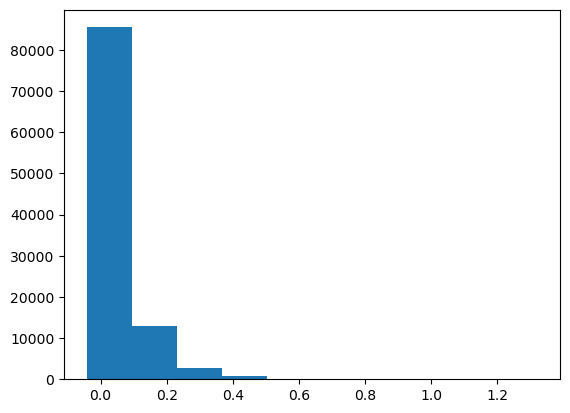

In [15]:
anom_catch.plot()

In [32]:
0.6/32

0.01875

In [39]:
0.01875*2

0.0375

In [34]:
0.01875*30#+0.0078125

0.5625

In [35]:
256/32

8.0

A full colour palette has 256 steps. Creating colour bar so that the negative and positive values shown use similar ranges in tones.

In [15]:
# Creating customised color map 
neg_colors = cm.cm.ice(np.linspace(0.8, .975, 24))
pos_colors = plt.cm.magma_r(np.linspace(0, .9, 232))
col = np.vstack((neg_colors, # [0.90163304, 0.90074459, 0.89591319, 1.],
                 pos_colors))
mymap = mcolors.LinearSegmentedColormap.from_list('mymap', col)
mymap.set_bad('white')
no_color = cm.cm.gray_r(np.linspace(0.05, 0.1, 5))
no = mcolors.LinearSegmentedColormap.from_list('g', no_color)

Checking colourbar before use

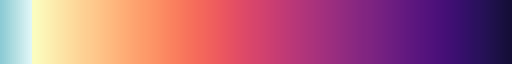

In [11]:
mymap

Create plot with first time step to ensure map is plotting correctly and to save colourbar for the animation.

Text(0.92, 0.85, '$60^{\\circ}$E')

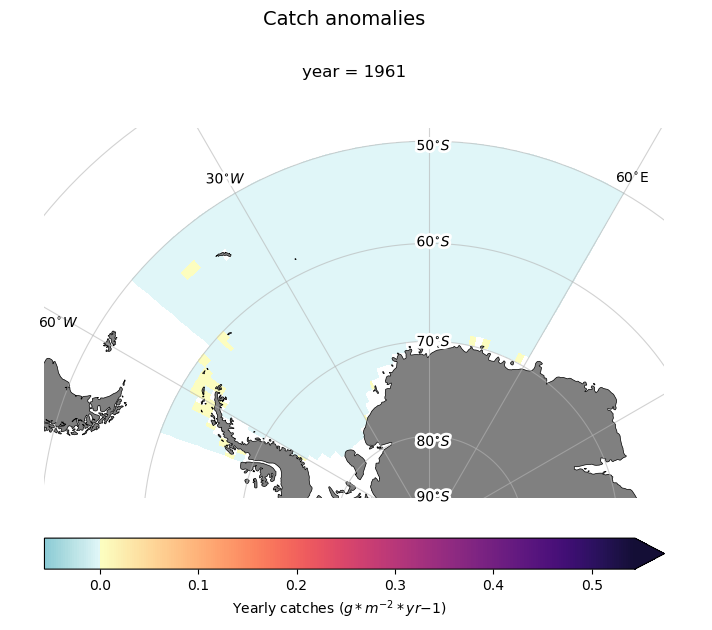

In [16]:
# Land mask
land_50m = cft.NaturalEarthFeature('physical', 'land', '50m', edgecolor = 'black',
                               facecolor = 'gray', linewidth = 0.5)
#Create figure
fig = plt.figure(figsize = [8, 7.])
axes = fig.add_subplot(111, projection = ccrs.SouthPolarStereo())
p1 = anom_catch.isel(year = 0).plot(cmap = mymap, vmin = -0.056249999999999994, vmax = 0.54375, 
                                add_colorbar = False, transform = ccrs.PlateCarree())
fig.suptitle("Catch anomalies", fontsize = 14)
axes.add_feature(land_50m)
axes.set_extent([-70, 35, -80, -48], crs = ccrs.PlateCarree())
cbar = fig.colorbar(p1, orientation = 'horizontal', extend = 'max', pad = 0.075)
cbar.set_label('Yearly catches ($g*m^{-2}*yr{-1}$)')
[s.set_visible(False) for s in axes.spines.values()]

gl = axes.gridlines(draw_labels = True, y_inline = False, 
                     color = "#b4b4b4", alpha = 0.6)
#Removing coordinate labels for latitude and longitude
gl.xlabel_style = {'alpha': 0}
gl.ylabel_style = {'alpha': 0}

#Adding gridline labels - latitudes - First column only
plt.text(0.6, 0.94, '$50^{\circ}S$', transform = axes.transAxes, fontsize = 10,
        path_effects = [PathEffects.withStroke(linewidth = 4, foreground = 'w')])
plt.text(0.6, 0.68, '$60^{\circ}S$', transform = axes.transAxes, fontsize = 10,
        path_effects = [PathEffects.withStroke(linewidth = 4, foreground = 'w')])
plt.text(0.6, 0.41, '$70^{\circ}S$', transform = axes.transAxes, fontsize = 10,
        path_effects = [PathEffects.withStroke(linewidth = 4, foreground = 'w')])
plt.text(0.6, 0.14, '$80^{\circ}S$', transform = axes.transAxes, fontsize = 10,
        path_effects = [PathEffects.withStroke(linewidth = 4, foreground = 'w')])
plt.text(0.6, -0.01, '$90^{\circ}S$', transform = axes.transAxes, fontsize = 10,
        path_effects = [PathEffects.withStroke(linewidth = 4, foreground = 'w')])
# plt.text(-0.13, 0.385, '$80^{\circ}S$', transform = axes.transAxes, fontsize = 10)
# plt.text(-0.13, 0.25, '$70^{\circ}S$', transform = axes.transAxes, fontsize = 10)
# plt.text(-0.13, 0.12, '$60^{\circ}S$', transform = axes.transAxes, fontsize = 10)
# plt.text(-0.13, -0.01, '$50^{\circ}S$', transform = axes.transAxes, fontsize = 10)

# #Adding gridline labels - longitudes - Last column only
plt.text(0.26, 0.85, '$30^{\circ}W$', transform = axes.transAxes, fontsize = 10,
        path_effects = [PathEffects.withStroke(linewidth = 4, foreground = 'w')])
plt.text(-0.01, 0.46, '$60^{\circ}W$', transform = axes.transAxes, fontsize = 10)
plt.text(0.92, 0.85, '$60^{\circ}$E', transform = axes.transAxes, fontsize = 10)
# plt.text(1, 0.5, '$120^{\circ}E$', transform = axes.transAxes, fontsize = 10)
# plt.text(0.43, -0.01, '$150^{\circ}E$', transform = axes.transAxes, fontsize = 10)

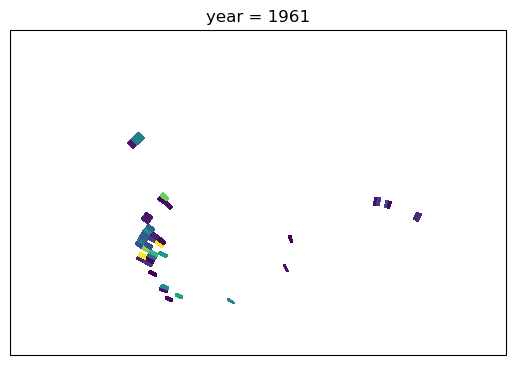

In [17]:
fig = plt.figure()
ax = fig.add_subplot(111, projection = ccrs.SouthPolarStereo())
anom_catch.where(anom_catch > 0).isel(year = 0).plot(ax = ax, add_colorbar = False,
                                                    transform = ccrs.PlateCarree())

## Animating maps of yearly catch anomalies

INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.PillowWriter'>
INFO:matplotlib.animation:Animation.save using <class 'matplotlib.animation.HTMLWriter'>


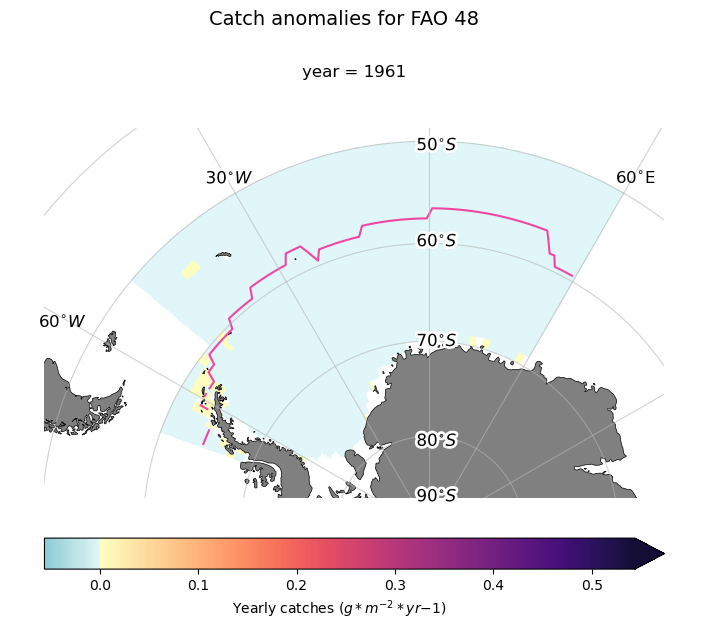

In [19]:
# Create figure
fig = plt.figure(figsize = [8, 7])
axes = fig.add_subplot(111, projection = ccrs.SouthPolarStereo())


p1 = anom_catch.isel(year = 0).plot(cmap = mymap, vmin = -0.056249999999999994, vmax = 0.54375, 
                                    add_colorbar = False)
# Animation function
def animate(year):
    #Select data for year being plotted
    ds = anom_catch.isel(year = year)
    #Clear axes so data from previous timestep is not shown
    axes.clear()
    #Ensure minimum and maximum values are the same across all timesteps
    ds.plot(cmap = mymap, ax = axes, vmin = -0.056249999999999994, vmax = 0.54375, 
            add_colorbar = False, transform = ccrs.PlateCarree())
    #Grid cells with no difference to obs shown in gray
    ds.where(ds == 0).plot(cmap = no, ax = axes, add_colorbar = False,
                           transform = ccrs.PlateCarree())
    #Add sea ice layer
    sie.sel(year = ds.year).plot.contour(levels = [0], colors = '#ef47a2',
                                         ax = axes,
                                         transform = ccrs.PlateCarree())
    #Add land mask
    axes.add_feature(land_50m)
    #Cutomise area shown in the maps
    axes.set_extent([-70, 35, -80, -48], crs = ccrs.PlateCarree())
    #Remove border around map
    [s.set_visible(False) for s in axes.spines.values()]
    gl = axes.gridlines(draw_labels = True, y_inline = False, 
                         color = "#b4b4b4", alpha = 0.6)
    # #Removing coordinate labels for latitude and longitude
    gl.xlabel_style = {'alpha': 0}
    gl.ylabel_style = {'alpha': 0}
    
    #Adding gridline labels - latitudes - First column only
    plt.text(0.6, 0.94, '$50^{\circ}S$', transform = axes.transAxes, fontsize = 12,
        path_effects = [PathEffects.withStroke(linewidth = 4, foreground = 'w')])
    plt.text(0.6, 0.68, '$60^{\circ}S$', transform = axes.transAxes, fontsize = 12,
            path_effects = [PathEffects.withStroke(linewidth = 4, foreground = 'w')])
    plt.text(0.6, 0.41, '$70^{\circ}S$', transform = axes.transAxes, fontsize = 12,
            path_effects = [PathEffects.withStroke(linewidth = 4, foreground = 'w')])
    plt.text(0.6, 0.14, '$80^{\circ}S$', transform = axes.transAxes, fontsize = 12,
            path_effects = [PathEffects.withStroke(linewidth = 4, foreground = 'w')])
    plt.text(0.6, -0.01, '$90^{\circ}S$', transform = axes.transAxes, fontsize = 12,
            path_effects = [PathEffects.withStroke(linewidth = 4, foreground = 'w')])
    # plt.text(-0.13, 0.99, '$50^{\circ}S$', transform = axes.transAxes, fontsize = 10)
    # plt.text(-0.13, 0.86, '$60^{\circ}S$', transform = axes.transAxes, fontsize = 10)
    # plt.text(-0.13, 0.73, '$70^{\circ}S$', transform = axes.transAxes, fontsize = 10)
    # plt.text(-0.13, 0.6, '$80^{\circ}S$', transform = axes.transAxes, fontsize = 10)
    # plt.text(-0.13, 0.49, '$90^{\circ}S$', transform = axes.transAxes, fontsize = 10)
    # plt.text(-0.13, 0.385, '$80^{\circ}S$', transform = axes.transAxes, fontsize = 10)
    # plt.text(-0.13, 0.25, '$70^{\circ}S$', transform = axes.transAxes, fontsize = 10)
    # plt.text(-0.13, 0.12, '$60^{\circ}S$', transform = axes.transAxes, fontsize = 10)
    # plt.text(-0.13, -0.01, '$50^{\circ}S$', transform = axes.transAxes, fontsize = 10)
    
    #Adding gridline labels - longitudes - Last column 
    plt.text(0.26, 0.85, '$30^{\circ}W$', transform = axes.transAxes, fontsize = 12,
        path_effects = [PathEffects.withStroke(linewidth = 4, foreground = 'w')])
    plt.text(-0.01, 0.46, '$60^{\circ}W$', transform = axes.transAxes, fontsize = 12)
    plt.text(0.92, 0.85, '$60^{\circ}$E', transform = axes.transAxes, fontsize = 12)
    # plt.text(0.17, 0.99, '$60^{\circ}W$', transform = axes.transAxes, fontsize = 10,
    #     path_effects = [PathEffects.withStroke(linewidth = 4, foreground = 'w')])
    # plt.text(-0.1, 0.27, '$120^{\circ}W$', transform = axes.transAxes, fontsize = 10)
    # plt.text(0.62, -0.07, '$180^{\circ}$', transform = axes.transAxes, fontsize = 10)
    # plt.text(0.95, 0.5, '$120^{\circ}E$', transform = axes.transAxes, fontsize = 10,
    #         path_effects = [PathEffects.withStroke(linewidth = 4, foreground = 'w')])
    # plt.text(0.46, 0.99, '$30^{\circ}E$', transform = axes.transAxes, fontsize = 10)
    # plt.text(1, 0.82, '$60^{\circ}E$', transform = axes.transAxes, fontsize = 10)
    # plt.text(1.01, 0.49, '$90^{\circ}E$', transform = axes.transAxes, fontsize = 10)
    # plt.text(1, 0.15, '$120^{\circ}E$', transform = axes.transAxes, fontsize = 10)
    # plt.text(0.43, -0.01, '$150^{\circ}E$', transform = axes.transAxes, fontsize = 10)

# Apply animation function
ani = animation.FuncAnimation(fig, animate, len(anom_catch.year), interval = 400)

# Customise colour bar
cbar = fig.colorbar(p1, orientation = 'horizontal', extend = 'max', pad = 0.075)
cbar.set_label('Yearly catches ($g*m^{-2}*yr{-1}$)')
reg_title = region.upper().replace('-', ' ')
fig.suptitle(f'Catch anomalies for {reg_title}', fontsize = 14)#, y = 0.75)

# Save animation as gif file
fout = os.path.join(outputs_folder, f'catch_anomalies_{region}.gif')
ani.save(fout, writer = 'imagemagick', fps = 2, 
         savefig_kwargs = {'bbox_inches': 'tight', 'pad_inches': 0.05})

# Show the animation in the kernel
HTML(ani.to_jshtml()) 

### Group data into decades

In [20]:
yrs = anom_catch.year.values
decades = ((yrs-yrs[0])/10).astype(int)

In [21]:
dec = pd.DataFrame({'years': anom_catch.year.values})
dec['decades'] = ((dec.years-dec.years[0])/10).astype(int)

In [23]:
anom_dec = []
for d in pd.unique(dec.decades):
    yrs = dec[dec.decades == d]['years'].values
    dec_mean = (anom_catch.sel(year = yrs).mean('year').
        assign_coords({'decade': (yrs.min()-1).astype(str)}))
    anom_dec.append(dec_mean)

anom_dec = xr.concat(anom_dec, dim = 'decade')

In [25]:
print(anom_dec.min().values, anom_dec.max().values)

-0.03372043545158819 0.6309856985807512


(array([5.904e+03, 3.091e+03, 4.730e+02, 5.120e+02, 1.650e+02, 4.200e+01,
        1.600e+01, 8.000e+00, 3.000e+00, 1.000e+00]),
 array([-0.03372044,  0.03275018,  0.09922079,  0.1656914 ,  0.23216202,
         0.29863263,  0.36510324,  0.43157386,  0.49804447,  0.56451509,
         0.6309857 ]),
 <BarContainer object of 10 artists>)

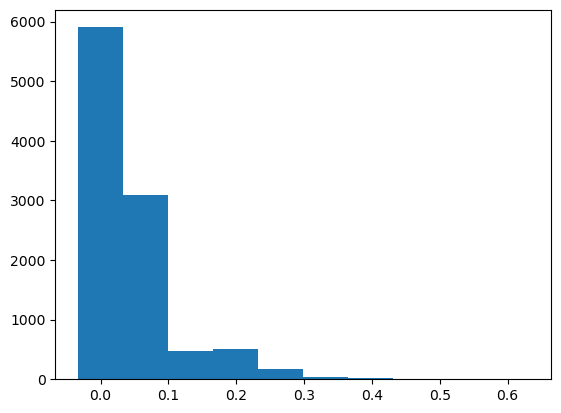

In [26]:
anom_dec.plot()

In [30]:
256/16

16.0

In [37]:
0.3/16*2

0.0375

In [63]:
0.015625/2

0.0078125

In [32]:
0.01875*14

0.2625

In [104]:
0.005/2

0.0025

In [41]:
# Creating customised color map 
neg_colors = cm.cm.ice(np.linspace(0.85, .975, 32))
pos_colors = plt.cm.magma_r(np.linspace(0, .9, 224))
col = np.vstack((neg_colors, # [0.90163304, 0.90074459, 0.89591319, 1.],
                 pos_colors))
mymap = mcolors.LinearSegmentedColormap.from_list('mymap', col)
mymap.set_bad('white')

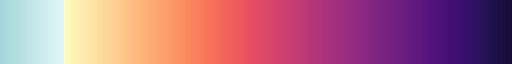

In [42]:
mymap

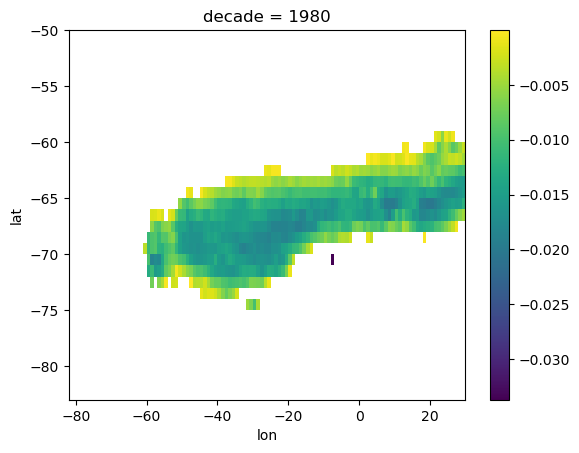

In [44]:
anom_dec.where(anom_dec < 0).isel(decade = 2).plot()

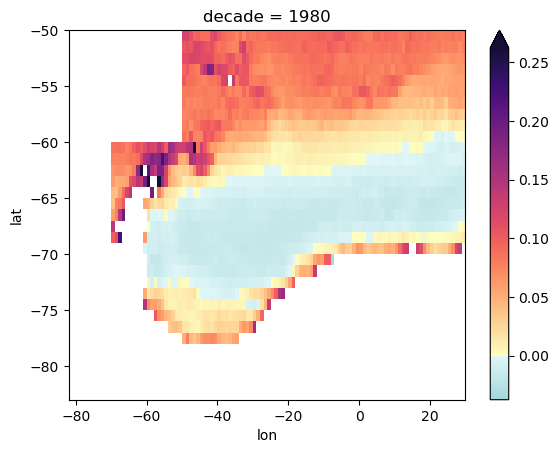

In [45]:
anom_dec.isel(decade = 2).plot(vmin = -0.0375, vmax = 0.2625,
                                        cmap = mymap)

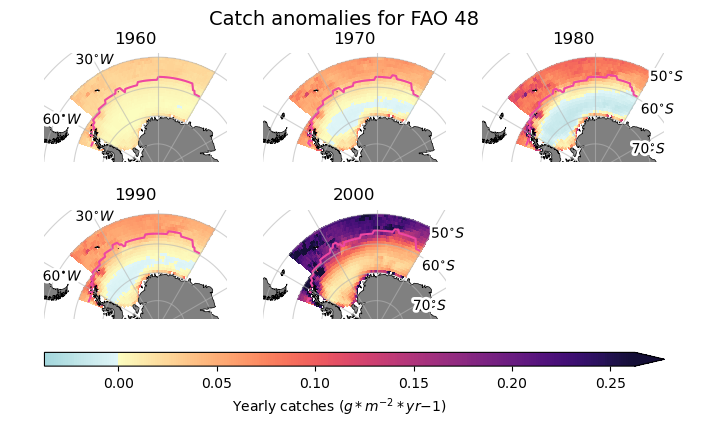

In [47]:
decades = anom_dec.decade.values.tolist()

fig = plt.figure(figsize = (8, 4.25))
gs = gridspec.GridSpec(nrows = 3, ncols = 3, height_ratios = (1, 1, 0.1))
# gs = gridspec.GridSpec(nrows = 3, ncols = 2, height_ratios = (1, 1, 0.1))

# gs.update(wspace = 0.2, hspace = 0.15)
ax = {}
for i in range(len(anom_dec.decade)):
    ax[i] = fig.add_subplot(gs[i], projection = ccrs.SouthPolarStereo())
    p1 = anom_dec.isel(decade = i).plot(vmin = -0.0375, vmax = 0.2625,
                                        cmap = mymap, add_colorbar = False,
                                        transform = ccrs.PlateCarree())
    sie_dec.isel(decade = i).plot.contour(levels = [0], colors = '#ef47a2',
                                          ax = ax[i],
                                          transform = ccrs.PlateCarree())
    ax[i].set_title(decades[i], y = 1.02)
    ax[i].add_feature(land_50m)
    #Cutomise area shown in the maps
    ax[i].set_extent([-70, 35, -80, -48], crs = ccrs.PlateCarree())
    #Remove border around map
    [s.set_visible(False) for s in ax[i].spines.values()]
    gl = ax[i].gridlines(draw_labels = True, y_inline = False, 
                         color = "#b4b4b4", alpha = 0.6)
    # #Removing coordinate labels for latitude and longitude
    gl.xlabel_style = {'alpha': 0}
    gl.ylabel_style = {'alpha': 0}
    
    # #Adding gridline labels - latitudes - First column only
    
    if i in [0, 3]:
        plt.text(0.17, 0.9, '$30^{\circ}W$', transform = ax[i].transAxes, fontsize = 10,
            path_effects = [PathEffects.withStroke(linewidth = 4, foreground = 'w')])
        plt.text(-0.01, 0.35, '$60^{\circ}W$', transform = ax[i].transAxes, fontsize = 10,
            path_effects = [PathEffects.withStroke(linewidth = 4, foreground = 'w')])
    #     plt.text(0.17, 0.99, '$60^{\circ}W$', transform = ax[i].transAxes, fontsize = 10,
    #     path_effects = [PathEffects.withStroke(linewidth = 4, foreground = 'w')])
    #     plt.text(-0.1, 0.27, '$120^{\circ}W$', transform = ax[i].transAxes, fontsize = 10)
    #     # plt.text(-0.26, 0.98, '$50^{\circ}S$', transform = ax[i].transAxes, fontsize = 10)
    #     # plt.text(-0.26, 0.85, '$60^{\circ}S$', transform = ax[i].transAxes, fontsize = 10)
    #     # plt.text(-0.26, 0.72, '$70^{\circ}S$', transform = ax[i].transAxes, fontsize = 10)
    #     # plt.text(-0.26, 0.59, '$80^{\circ}S$', transform = ax[i].transAxes, fontsize = 10)
    #     # plt.text(-0.26, 0.48, '$90^{\circ}S$', transform = ax[i].transAxes, fontsize = 10)
    #     # plt.text(-0.26, 0.37, '$80^{\circ}S$', transform = ax[i].transAxes, fontsize = 10)
    #     # plt.text(-0.26, 0.24, '$70^{\circ}S$', transform = ax[i].transAxes, fontsize = 10)
    #     # plt.text(-0.26, 0.11, '$60^{\circ}S$', transform = ax[i].transAxes, fontsize = 10)
    #     # plt.text(-0.26, -0.02, '$50^{\circ}S$', transform = ax[i].transAxes, fontsize = 10)
    elif i in [2, 4]:
        plt.text(0.92, 0.745, '$50^{\circ}S$', transform = ax[i].transAxes, fontsize = 10,
            path_effects = [PathEffects.withStroke(linewidth = 4, foreground = 'w')])
        plt.text(0.87, 0.445, '$60^{\circ}S$', transform = ax[i].transAxes, fontsize = 10,
                path_effects = [PathEffects.withStroke(linewidth = 4, foreground = 'w')])
        plt.text(0.82, 0.08, '$70^{\circ}S$', transform = ax[i].transAxes, fontsize = 10,
                path_effects = [PathEffects.withStroke(linewidth = 4, foreground = 'w')])
    #     plt.text(0.95, 0.91, '$60^{\circ}$E', transform = ax[i].transAxes, fontsize = 10,
    #             path_effects = [PathEffects.withStroke(linewidth = 4, foreground = 'w')])
    #     plt.text(0.95, 0.5, '$120^{\circ}E$', transform = ax[i].transAxes, fontsize = 10,
    #             path_effects = [PathEffects.withStroke(linewidth = 4, foreground = 'w')])
    # #     #Adding gridline labels - longitudes - Last column only
    # #     plt.text(0.48, 0.98, '$30^{\circ}E$', transform = ax[i].transAxes, fontsize = 10)
    # #     plt.text(1, 0.81, '$60^{\circ}E$', transform = ax[i].transAxes, fontsize = 10)
    # #     plt.text(1.01, 0.48, '$90^{\circ}E$', transform = ax[i].transAxes, fontsize = 10)
    # #     plt.text(1, 0.15, '$120^{\circ}E$', transform = ax[i].transAxes, fontsize = 10)
    # #     plt.text(0.44, -0.01, '$150^{\circ}E$', transform = ax[i].transAxes, fontsize = 10)

cbar = fig.colorbar(p1, cax = plt.subplot(gs[-1,:]), orientation = 'horizontal', 
                    extend = 'max', pad = 0.075)
cbar.set_label('Yearly catches ($g*m^{-2}*yr{-1}$)', y = .95)
reg_title = region.upper().replace('-', ' ')
fig.suptitle(f'Catch anomalies for {reg_title}', fontsize = 14, y = .95)

#Saving figure
fout = os.path.join(outputs_folder, f'decadal_catch_anomalies_{region}.png')
plt.savefig(fout, dpi = 300, bbox_inches = 'tight', pad_inches = 0.05)

In [ ]:
#Loading predators
predators = xr.open_mfdataset(glob(
    os.path.join(gridded_outputs, 'predators*')))['predators']

#Loading detritivores
detritivores = xr.open_mfdataset(glob(
    os.path.join(gridded_outputs, 'detritivores*')))['detritivores']

#Loading pelagic preferences
pel_pref = xr.open_zarr(glob(os.path.join(base_folder, 'gridded_params',
                                          model_res, 'pref-pelagic*'))[0])['pref_pelagic']

#Loading benthic preferences
ben_pref = xr.open_zarr(glob(os.path.join(base_folder, 'gridded_params',
                                          model_res, 'pref-benthos*'))[0])['pref_benthos']

#Size class bins
log10_size_bins_mat = xr.open_zarr('outputs/log10_size_bins_matrix.zarr/')['size_bins']
size_bin_vals = 10**log10_size_bins_mat

## Calculating mean preferences

In [5]:
pel_pref = np.round(pel_pref.mean().values.tolist(), 2)
ben_pref = np.round(ben_pref.mean().values.tolist(), 2)

## Subset biomass data 
Selecting relevant size classes for each group.

In [6]:
pred_summ = predators.isel(size_class = slice(gridded_params['ind_min_pred_size'], None)) 
det_summ = detritivores.isel(size_class = 
                             slice(gridded_params['ind_min_detritivore_size'], None)) 

## Preparing data before plotting 

### Option 1: Size spectrum from last available time step 

In [7]:
#Biomass is summed across area of interest
pred_summ_last = np.log10(pred_summ.isel(time = -1).sum(('lat', 'lon')))
det_summ_last = np.log10(det_summ.isel(time = -1).sum(('lat', 'lon')))

### Saving results 

In [8]:
size_spectra_last = xr.Dataset(data_vars = {'predators': pred_summ_last,
                                            'detritivores': det_summ_last})
#Getting last year from data
yr = str(size_spectra_last.time.dt.year.values.tolist())

#Saving plot
fn = f'size_spectrum_{region}_{model_res}_{yr}.nc'
size_spectra_last.to_netcdf(os.path.join(plot_folder, fn))

### Plotting size spectrum 

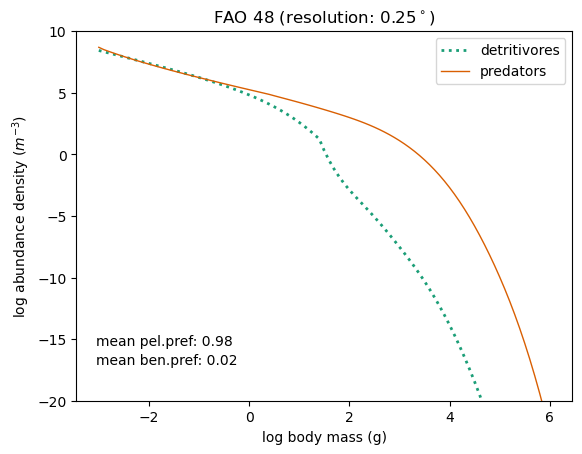

In [9]:
#Initialise figure
fig = plt.figure()
ax = fig.add_subplot()

#Plot detritivore and predator biomass
det_summ_last.plot(ax = ax, color = '#1b9e77', ls = 'dotted', lw = 2, 
              label = 'detritivores')
pred_summ_last.plot(ax = ax, color = '#d95f02', lw = 1, label = 'predators')

#Changing axes labels
ax.set_xlabel('log body mass (g)')
ax.set_ylabel('log abundance density ($m^{-3}$)')

#Adding legend
ax.legend(loc = 'upper right', frameon = True)

#Adding title
#Reformat region variable to use in title
reg_clean = region.upper().replace('-', ' ')
#Adding resolution to title
if model_res == '025deg':
    ax.set_title(f'{reg_clean} (resolution: 0.25$^\circ$)')
elif model_res == '1deg':
    ax.set_title(f'{reg_clean} (resolution: 1$^\circ$)')

#Setting minimum and maximum values along y axis
max_y = max([det_summ_last.max(), pred_summ_last.max()])
plt.ylim(-20, np.ceil(max_y.values)+1)

#Adding text
ax.text(0.04, 0.15, f'mean pel.pref: {pel_pref}', transform = ax.transAxes)
ax.text(0.04, 0.1, f'mean ben.pref: {ben_pref}', transform = ax.transAxes)

#Saving plot
fn = f'size_spectrum_{region}_{model_res}_{yr}.png'
plt.savefig(os.path.join(plot_folder, fn), dpi = 300, bbox_inches = 'tight', 
            pad_inches = 0.05)

### Option 2: Size spectrum from mean values across all timesteps 

In [10]:
pred_summ_all = np.log10(pred_summ.mean('time').sum(('lat', 'lon')))
det_summ_all = np.log10(det_summ.mean('time').sum(('lat', 'lon')))

### Saving results 

In [18]:
size_spectra_all = xr.Dataset(data_vars = {'predators': pred_summ_all,
                                           'detritivores': det_summ_all})
#Getting start and end years
s_yr = pred_summ.time.dt.year.min().values.tolist()
e_yr = pred_summ.time.dt.year.max().values.tolist()

#Saving plot
fn = f'size_spectrum_mean_{region}_{model_res}_{s_yr}-{e_yr}.nc'
size_spectra_all.to_netcdf(os.path.join(plot_folder, fn))

### Plotting size spectrum 

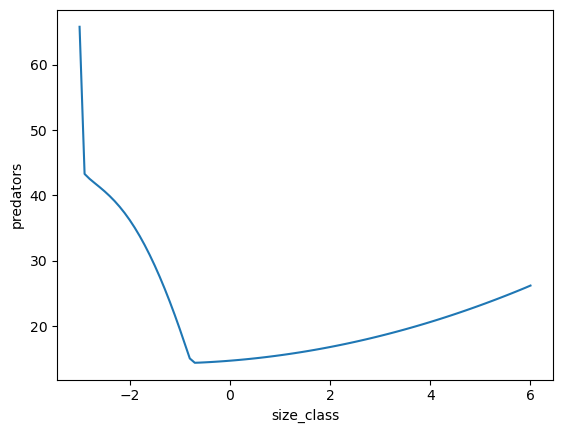

In [19]:
pred_summ_all.plot()

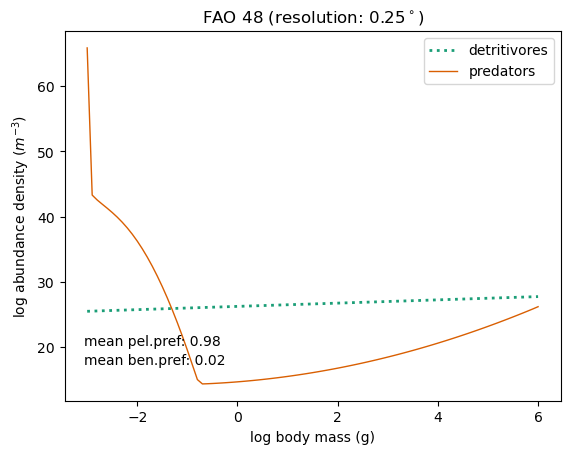

In [21]:
#Initialise figure
fig = plt.figure()
ax = fig.add_subplot()

#Plot detritivore and predator biomass
det_summ_all.plot(ax = ax, color = '#1b9e77', ls = 'dotted', lw = 2, 
              label = 'detritivores')
pred_summ_all.plot(ax = ax, color = '#d95f02', lw = 1, label = 'predators')

#Changing axes labels
ax.set_xlabel('log body mass (g)')
ax.set_ylabel('log abundance density ($m^{-3}$)')

#Adding legend
ax.legend(loc = 'upper right', frameon = True)

#Adding title
#Reformat region variable to use in title
reg_clean = region.upper().replace('-', ' ')
#Adding resolution to title
if model_res == '025deg':
    ax.set_title(f'{reg_clean} (resolution: 0.25$^\circ$)')
elif model_res == '1deg':
    ax.set_title(f'{reg_clean} (resolution: 1$^\circ$)')

#Setting minimum and maximum values along y axis
max_y = max([det_summ_all.max(), pred_summ_all.max()])
# plt.ylim(-20, np.ceil(max_y.values)+1)

#Adding text
ax.text(0.04, 0.15, f'mean pel.pref: {pel_pref}', transform = ax.transAxes)
ax.text(0.04, 0.1, f'mean ben.pref: {ben_pref}', transform = ax.transAxes)

#Saving plot
fn = f'size_spectrum_mean_{region}_{model_res}_{s_yr}-{e_yr}.png'
plt.savefig(os.path.join(plot_folder, fn), dpi = 300, bbox_inches = 'tight', 
            pad_inches = 0.05)

### Option 3: Size spectrum from mean decadal values

In [22]:
pred_summ['decade'] = (np.floor(pred_summ.time.dt.year/10)*10).astype(int)
pred_summ_dec = np.log10(pred_summ.groupby('decade').mean('time').sum(('lat', 'lon')))
det_summ['decade'] = (np.floor(det_summ.time.dt.year/10)*10).astype(int)
det_summ_dec = np.log10(det_summ.groupby('decade').mean('time').sum(('lat', 'lon')))

### Saving results 

In [23]:
size_spectra_dec = xr.Dataset(data_vars = {'predators': pred_summ_dec,
                                           'detritivores': det_summ_dec})
#Getting last year from data
s_dec = pred_summ.decade.min().values.tolist()
e_dec = pred_summ.decade.max().values.tolist()

#Saving plot
fn = f'size_spectrum_mean_decade_{region}_{model_res}_{s_dec}-{e_dec}.nc'
size_spectra_dec.to_netcdf(os.path.join(plot_folder, fn))

### Plotting size spectrum 

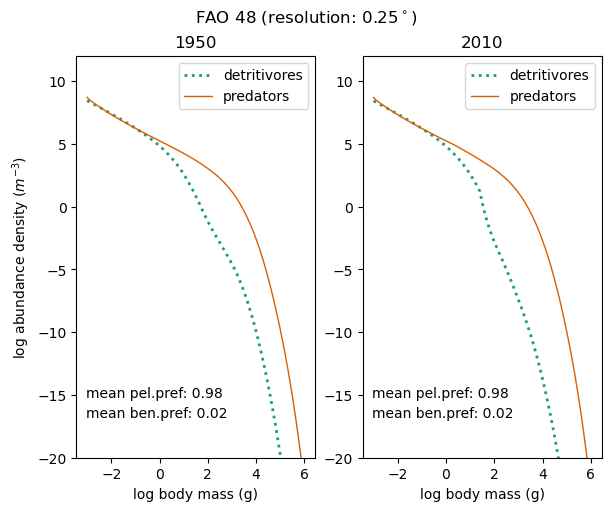

In [25]:
#Initialise figure
fig, ax = plt.subplots(1, 2, figsize = [6, 5], layout = 'constrained')

#Plot detritivore and predator biomass - last decade of spinup
det_summ_dec.sel(decade = 1950).plot(ax = ax[0], color = '#1b9e77', ls = 'dotted', lw = 2, 
              label = 'detritivores')
pred_summ_dec.sel(decade = 1950).plot(ax = ax[0], color = '#d95f02', lw = 1, label = 'predators')
#Add title
ax[0].set_title('1950')

#Plot detritivore and predator biomass - last decade of modelled period
det_summ_dec.sel(decade = 2010).plot(ax = ax[1], color = '#1b9e77', ls = 'dotted', lw = 2, 
              label = 'detritivores')
pred_summ_dec.sel(decade = 2010).plot(ax = ax[1], color = '#d95f02', lw = 1, label = 'predators')
#Add title
ax[1].set_title('2010')

#Finding range for y axis
max_y = max([det_summ_dec.max(), pred_summ_dec.max()])
for a in ax:
    #Changing axes labels
    a.set_xlabel('log body mass (g)')
    #Setting minimum and maximum values along y axis
    a.set_ylim(-20, np.ceil(max_y.values)+1)
    #Adding legend
    a.legend(loc = 'upper right', frameon = True)
    #Adding mean preferences
    a.text(0.04, 0.15, f'mean pel.pref: {pel_pref}', transform = a.transAxes)
    a.text(0.04, 0.1, f'mean ben.pref: {ben_pref}', transform = a.transAxes)

ax[0].set_ylabel('log abundance density ($m^{-3}$)')
ax[1].set_ylabel('')

#Adding title
#Reformat region variable to use in title
reg_clean = region.upper().replace('-', ' ')
#Adding resolution to title
if model_res == '025deg':
    fig.suptitle(f'{reg_clean} (resolution: 0.25$^\circ$)')
elif model_res == '1deg':
    fig.suptitle(f'{reg_clean} (resolution: 1$^\circ$)')

#Saving plot
fn = f'size_spectrum_mean_decade_{region}_{model_res}_1950-2010.png'
plt.savefig(os.path.join(plot_folder, fn), dpi = 300, bbox_inches = 'tight', 
            pad_inches = 0.05)

## Calculate total biomass for `predators` and `detritivores` 

In [26]:
tot_pred_bio = ((predators.isel(size_class = slice(gridded_params['ind_min_pred_size'], 
                                                  None))*
                gridded_params['log_size_increase']*size_bin_vals).
                sum('size_class')).groupby('time.year').mean('time')

tot_pred_det = (detritivores.isel(size_class = 
                                  slice(gridded_params['ind_min_detritivore_size'], 
                                        None))*gridded_params['log_size_increase']*
                size_bin_vals).sum('size_class').groupby('time.year').mean('time')

Text(0.5, 1.0, 'Total predator biomass 2010')

/g/data/xp65/public/apps/med_conda/envs/analysis3-25.06/lib/python3.11/site-packages/cartopy/io/__init__.py:241: DownloadWarning: Downloading: https://naturalearth.s3.amazonaws.com/50m_physical/ne_50m_land.zip
  warnings.warn(f'Downloading: {url}', DownloadWarning)


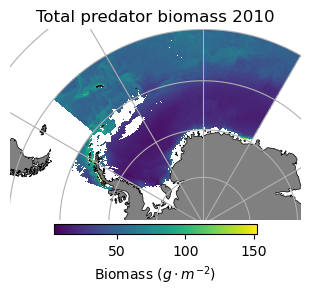

In [27]:
#Initialise figure
fig = plt.figure(figsize = [3.75, 5])
ax = fig.add_subplot(projection = ccrs.SouthPolarStereo())

#Land mask
land_50m = cft.NaturalEarthFeature('physical', 'land', '50m', edgecolor = 'black', 
                                   facecolor = 'gray', linewidth = 0.5)

#Plot a year
ds = tot_pred_bio.where(tot_pred_bio != 0).isel(year = -1)
p1 = ds.plot(ax = ax, add_colorbar = False, transform = ccrs.PlateCarree())

#Add land
ax.add_feature(land_50m)
#Add gridlines
ax.gridlines()
#Remove rectangular boundaries outside map
[s.set_visible(False) for s in ax.spines.values()]

#Add colorbar below plot
plt.colorbar(p1, ax = ax, orientation = 'horizontal', shrink = 0.7, 
             label = 'Biomass ($g\cdot m^{-2}$)', pad = 0.01)

#Add title
yr = ds.year.values.tolist()
ax.set_title(f'Total predator biomass {yr}')